In [5]:
import numpy as np
from matplotlib import pyplot as plt
import cv2

In [6]:
img = plt.imread('lena_color.gif')

In [7]:
imb3 = img[:,:,1]

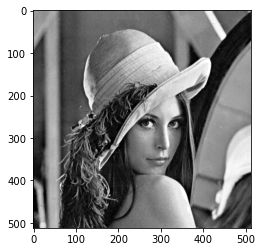

In [8]:
plt.imshow(imb3,cmap='gray')

In [9]:
imb3.shape

(512, 512)

In [10]:
m,n = imb3.shape

In [11]:
def convolution(img,mask,k):
    p = int((k-1)/2) 
    img_pad=np.pad(img, ((p,p),(p,p)), 'constant')
    m,n = img_pad.shape
    img_covule = np.zeros([m,n])

    for i in range(1, m-1):
        for j in range(1, n-1):
            temp = ((img_pad[i-1, j-1]*mask[0, 0])+(img_pad[i-1, j]*mask[0, 1])+(img_pad[i-1, j + 1]*mask[0, 2])+(img_pad[i, j-1]*mask[1, 0])+(img_pad[i, j]*mask[1, 1])+(img_pad[i, j + 1]*mask[1, 2])+(img_pad[i+1,j-1]*mask[2, 0])+(img_pad[i + 1, j]*mask[2, 1])+(img_pad[i + 1, j + 1]*mask[2, 2]))
            img_covule[i,j] = temp
    return img_covule

In [12]:
def convolution_merge(img,mask,mask1,k):
    p = int((k-1)/2) 
    img_pad=np.pad(img, ((p,p),(p,p)), 'constant')
    m,n = img_pad.shape
    img_covule = np.zeros([m,n])

    for i in range(1, m-1):
        for j in range(1, n-1):
            vertical_score = ((img_pad[i-1, j-1]*mask[0, 0])+(img_pad[i-1, j]*mask[0, 1])+(img_pad[i-1, j + 1]*mask[0, 2])+(img_pad[i, j-1]*mask[1, 0])+(img_pad[i, j]*mask[1, 1])+(img_pad[i, j + 1]*mask[1, 2])+(img_pad[i+1,j-1]*mask[2, 0])+(img_pad[i + 1, j]*mask[2, 1])+(img_pad[i + 1, j + 1]*mask[2, 2]))
            
            horizontal_score = ((img_pad[i-1, j-1]*mask1[0, 0])+(img_pad[i-1, j]*mask1[0, 1])+(img_pad[i-1, j + 1]*mask1[0, 2])+(img_pad[i, j-1]*mask1[1, 0])+(img_pad[i, j]*mask1[1, 1])+(img_pad[i, j + 1]*mask1[1, 2])+(img_pad[i+1,j-1]*mask1[2, 0])+(img_pad[i + 1, j]*mask1[2, 1])+(img_pad[i + 1, j + 1]*mask1[2, 2]))

            edge_score = (vertical_score**2 + horizontal_score**2)**.5

            img_covule[i,j] = edge_score
    return img_covule

# Prewitt Operator

In [13]:
vertical_filter = np.array([[-1,-1,-1],[0,0,0],[1,1,1]])

In [14]:
prewitt_vertical_img = convolution(imb3,vertical_filter,3)

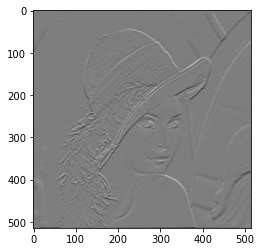

In [15]:
plt.imshow(prewitt_vertical_img,cmap='gray')

In [16]:
horizontal_filter = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])

In [17]:
prewitt_horizontal_img = convolution(imb3,horizontal_filter,3)

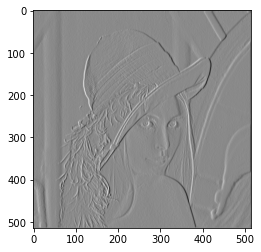

In [18]:
plt.imshow(prewitt_horizontal_img,cmap='gray')

In [19]:
prewitt_img = convolution_merge(imb3,vertical_filter,horizontal_filter,3)

Text(0.5, 1.0, 'prewitt Image')

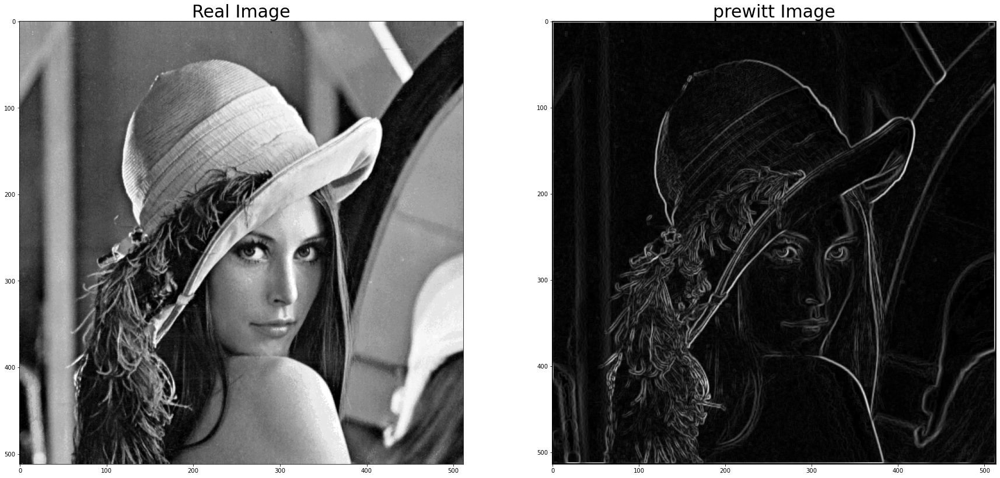

In [20]:
fig = plt.figure(figsize=(30,30))
a=fig.add_subplot(1,2,1)
plt.imshow(imb3,cmap='gray')
plt.title('Real Image',fontsize=30)

a=fig.add_subplot(1,2,2)
plt.imshow(prewitt_img,cmap='gray')
plt.title('prewitt Image',fontsize=30)

# sobel operator

In [21]:
vertical_filter1 = np.array([[-1,-2,-1],[0,0,0],[1,2,1]])

In [22]:
horizontal_filter1 = np.array([[-1,0,1],[-2,0,2],[-1,0,1]])

In [23]:
sobel_img = convolution_merge(imb3,vertical_filter1,horizontal_filter1,3)

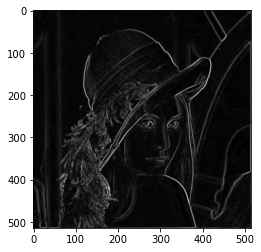

In [24]:
plt.imshow(sobel_img,cmap='gray')

Text(0.5, 1.0, 'sobel Image')

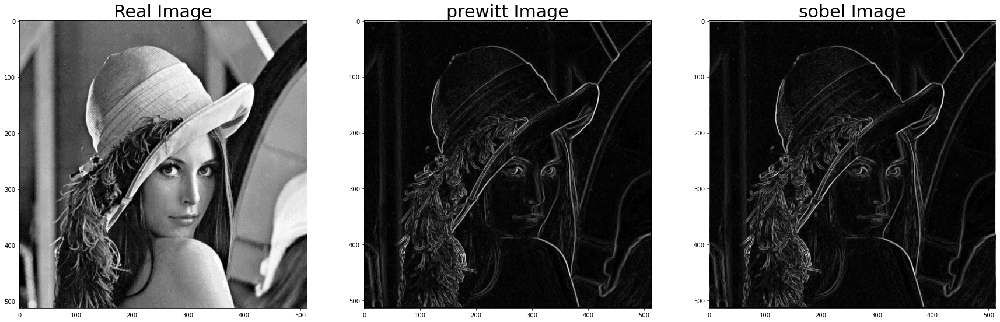

In [25]:
fig = plt.figure(figsize=(30,30))
a=fig.add_subplot(1,3,1)
plt.imshow(imb3,cmap='gray')
plt.title("Real Image", fontsize=30)

a=fig.add_subplot(1,3,2)
plt.imshow(prewitt_img,cmap='gray')
plt.title('prewitt Image',fontsize=30)

a=fig.add_subplot(1,3,3)
plt.imshow(sobel_img,cmap='gray',)
plt.title('sobel Image',fontsize=30)


# compass operator

In [26]:
com_op1 = np.array([[1,1,0],[1,0,-1],[0,-1,-1]])
com_op2 = np.array([[1,1,1],[0,0,0],[-1,-1,-1]])
com_op3 = np.array([[0,1,1],[-1,0,1],[-1,-1,0]]) 
com_op4 = np.array([[1,0,-1],[1,0,-1],[1,0,-1]])
com_op5 = np.array([[-1,0,1],[-1,0,1],[-1,0,1]])
com_op6 = np.array([[0,-1,-1],[1,0,-1],[1,1,0]])
com_op7 = np.array([[-1,-1,-1],[0,0,0],[1,1,1]])
com_op8 = np.array([[-1,-1,0],[-1,0,1],[0,1,1]])

In [27]:
def convolution_merge_com(img,mask,mask1,mask2,mask3,mask4,mask5,mask6,mask7,k):
    p = int((k-1)/2) 
    img_pad=np.pad(img, ((p,p),(p,p)), 'constant')
    m,n = img_pad.shape
    img_covule = np.zeros([m,n])
    com_op1_img = np.zeros([m,n])
    com_op8_img = np.zeros([m,n])
    com_op2_img = np.zeros([m,n])
    com_op3_img = np.zeros([m,n])
    com_op4_img = np.zeros([m,n])
    com_op5_img = np.zeros([m,n])
    com_op6_img = np.zeros([m,n])
    com_op7_img = np.zeros([m,n])


    for i in range(1, m-1):
        for j in range(1, n-1):
            com_op1_score = ((img_pad[i-1, j-1]*mask[0, 0])+(img_pad[i-1, j]*mask[0, 1])+(img_pad[i-1, j + 1]*mask[0, 2])+(img_pad[i, j-1]*mask[1, 0])+(img_pad[i, j]*mask[1, 1])+(img_pad[i, j + 1]*mask[1, 2])+(img_pad[i+1,j-1]*mask[2, 0])+(img_pad[i + 1, j]*mask[2, 1])+(img_pad[i + 1, j + 1]*mask[2, 2]))

            com_op1_img[i][j] = com_op1_score
            
            com_op2_score = ((img_pad[i-1, j-1]*mask1[0, 0])+(img_pad[i-1, j]*mask1[0, 1])+(img_pad[i-1, j + 1]*mask1[0, 2])+(img_pad[i, j-1]*mask1[1, 0])+(img_pad[i, j]*mask1[1, 1])+(img_pad[i, j + 1]*mask1[1, 2])+(img_pad[i+1,j-1]*mask1[2, 0])+(img_pad[i + 1, j]*mask1[2, 1])+(img_pad[i + 1, j + 1]*mask1[2, 2]))

            com_op2_img[i][j] = com_op2_score

            com_op3_score = ((img_pad[i-1, j-1]*mask2[0, 0])+(img_pad[i-1, j]*mask2[0, 1])+(img_pad[i-1, j + 1]*mask2[0, 2])+(img_pad[i, j-1]*mask2[1, 0])+(img_pad[i, j]*mask2[1, 1])+(img_pad[i, j + 1]*mask2[1, 2])+(img_pad[i+1,j-1]*mask2[2, 0])+(img_pad[i + 1, j]*mask2[2, 1])+(img_pad[i + 1, j + 1]*mask2[2, 2]))

            com_op3_img[i][j] = com_op3_score

            com_op4_score = ((img_pad[i-1, j-1]*mask3[0, 0])+(img_pad[i-1, j]*mask3[0, 1])+(img_pad[i-1, j + 1]*mask3[0, 2])+(img_pad[i, j-1]*mask3[1, 0])+(img_pad[i, j]*mask3[1, 1])+(img_pad[i, j + 1]*mask3[1, 2])+(img_pad[i+1,j-1]*mask3[2, 0])+(img_pad[i + 1, j]*mask3[2, 1])+(img_pad[i + 1, j + 1]*mask3[2, 2]))

            com_op4_img[i][j] = com_op4_score

            com_op5_score = ((img_pad[i-1, j-1]*mask4[0, 0])+(img_pad[i-1, j]*mask4[0, 1])+(img_pad[i-1, j + 1]*mask4[0, 2])+(img_pad[i, j-1]*mask4[1, 0])+(img_pad[i, j]*mask4[1, 1])+(img_pad[i, j + 1]*mask4[1, 2])+(img_pad[i+1,j-1]*mask4[2, 0])+(img_pad[i + 1, j]*mask4[2, 1])+(img_pad[i + 1, j + 1]*mask4[2, 2]))

            com_op5_img[i][j] = com_op5_score

            com_op6_score = ((img_pad[i-1, j-1]*mask5[0, 0])+(img_pad[i-1, j]*mask5[0, 1])+(img_pad[i-1, j + 1]*mask5[0, 2])+(img_pad[i, j-1]*mask5[1, 0])+(img_pad[i, j]*mask5[1, 1])+(img_pad[i, j + 1]*mask5[1, 2])+(img_pad[i+1,j-1]*mask5[2, 0])+(img_pad[i + 1, j]*mask5[2, 1])+(img_pad[i + 1, j + 1]*mask5[2, 2]))

            com_op6_img[i][j] = com_op6_score

            com_op7_score = ((img_pad[i-1, j-1]*mask6[0, 0])+(img_pad[i-1, j]*mask6[0, 1])+(img_pad[i-1, j + 1]*mask6[0, 2])+(img_pad[i, j-1]*mask6[1, 0])+(img_pad[i, j]*mask6[1, 1])+(img_pad[i, j + 1]*mask6[1, 2])+(img_pad[i+1,j-1]*mask6[2, 0])+(img_pad[i + 1, j]*mask6[2, 1])+(img_pad[i + 1, j + 1]*mask6[2, 2]))

            com_op7_img[i][j] = com_op7_score

            com_op8_score = ((img_pad[i-1, j-1]*mask7[0, 0])+(img_pad[i-1, j]*mask7[0, 1])+(img_pad[i-1, j + 1]*mask7[0, 2])+(img_pad[i, j-1]*mask7[1, 0])+(img_pad[i, j]*mask7[1, 1])+(img_pad[i, j + 1]*mask7[1, 2])+(img_pad[i+1,j-1]*mask7[2, 0])+(img_pad[i + 1, j]*mask7[2, 1])+(img_pad[i + 1, j + 1]*mask7[2, 2]))

            com_op8_img[i][j] = com_op8_score

            arr = np.array([com_op1_score,com_op2_score,com_op3_score,com_op5_score,com_op6_score,com_op7_score,com_op8_score])
            maxElement = np.amax(arr)

            img_covule[i,j] = maxElement
            
    fig = plt.figure(figsize=(30,30))
    a=fig.add_subplot(3,3,1)
    plt.imshow(com_op1_img,cmap='gray')
    plt.title('com_op1_img',fontsize=30)

    a=fig.add_subplot(3,3,2)
    plt.imshow(com_op2_img,cmap='gray')
    plt.title('com_op2_img',fontsize=30)

    a=fig.add_subplot(3,3,3)
    plt.imshow(com_op3_img,cmap='gray')
    plt.title('com_op3_img',fontsize=30)

    a=fig.add_subplot(3,3,4)
    plt.imshow(com_op4_img,cmap='gray')
    plt.title('com_op4_img',fontsize=30)

    a=fig.add_subplot(3,3,5)
    plt.imshow(com_op5_img,cmap='gray')
    plt.title('com_op5_img',fontsize=30)

    a=fig.add_subplot(3,3,6)
    plt.imshow(com_op6_img,cmap='gray')
    plt.title('com_op6_img',fontsize=30)

    a=fig.add_subplot(3,3,7)
    plt.imshow(com_op7_img,cmap='gray')
    plt.title('com_op7_img',fontsize=30)

    a=fig.add_subplot(3,3,8)
    plt.imshow(com_op8_img,cmap='gray')
    plt.title('com_op8_img',fontsize=30)
    return img_covule

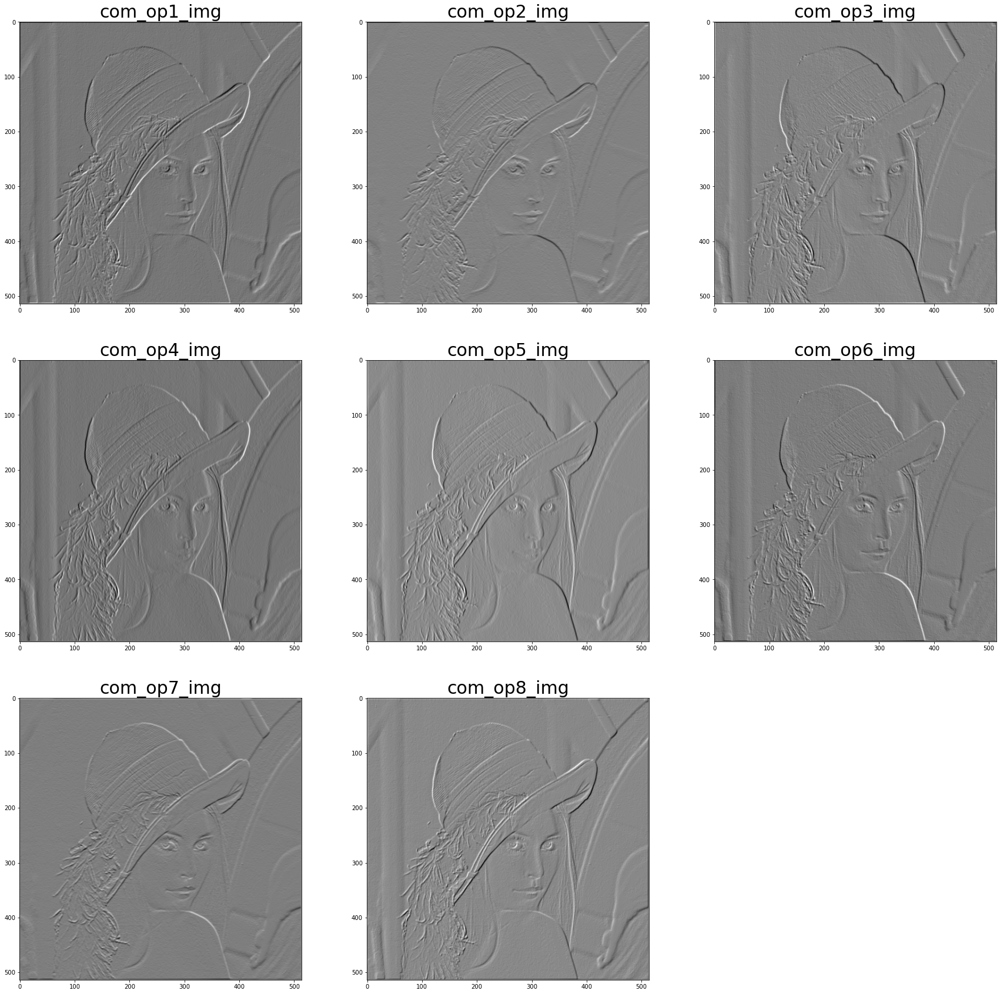

In [28]:
com_img = convolution_merge_com(imb3,com_op1,com_op2,com_op3,com_op4,com_op5,com_op6,com_op7,com_op8,3)

Text(0.5, 1.0, 'Merging all 8 operator')

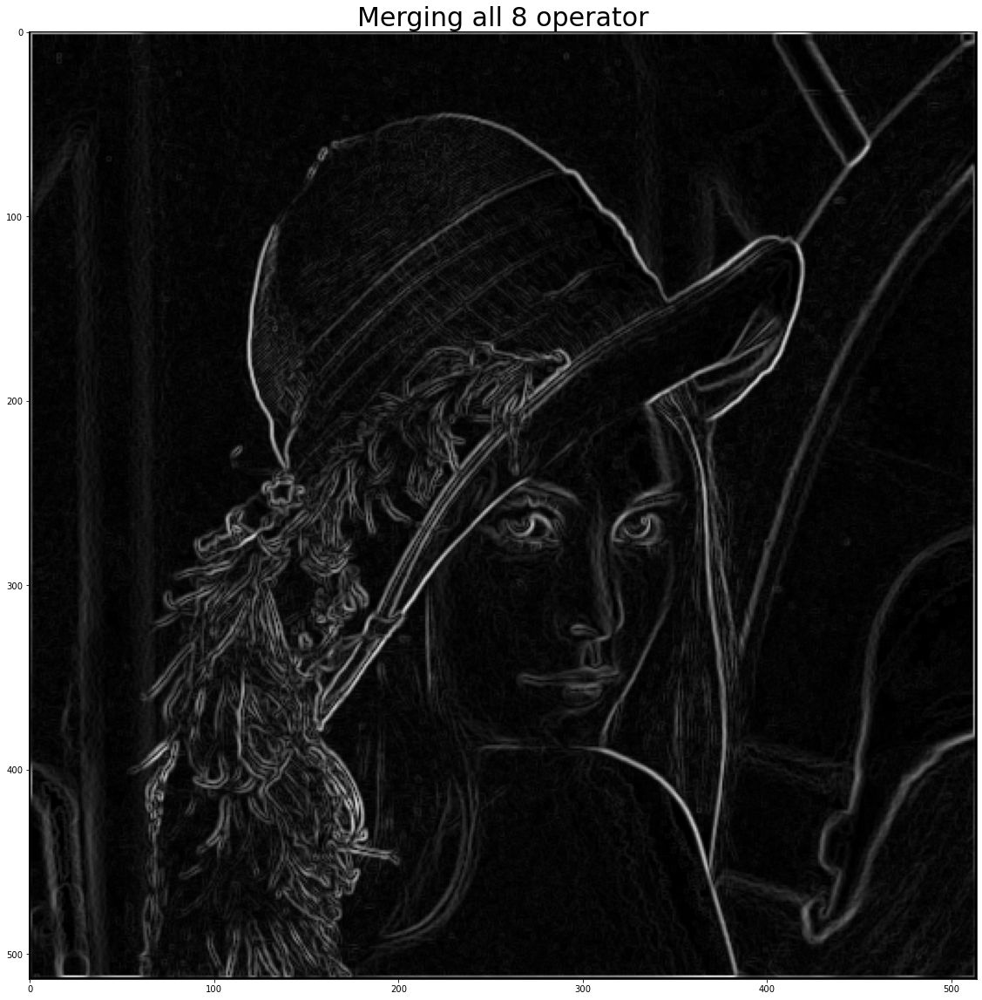

In [29]:
fig = plt.figure(figsize=(20,20))
plt.imshow(com_img,cmap='gray') #After merging all 8 operators
plt.title('Merging all 8 operator',fontsize=30)

# Laplacian of gaussian Operator

In [30]:
dst = cv2.GaussianBlur(imb3,(5,5),cv2.BORDER_DEFAULT)

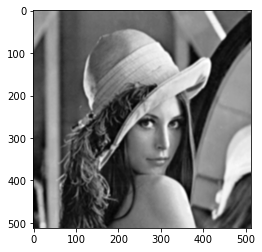

In [31]:
plt.imshow(dst,cmap='gray')

In [32]:
#a=0

In [33]:
lp_op1 = np.array([[0,1,0],[1,-4,1],[0,1,0]])

In [34]:
lp_op1_img = convolution(imb3,lp_op1,3)

In [35]:
#a=0.5

In [36]:
lp_op2 = np.array([[1,1,1],[1,-8,1],[1,1,1]])

In [37]:
lp_op2_img = convolution(imb3,lp_op2,3)

Text(0.5, 1.0, 'a = 0.5')

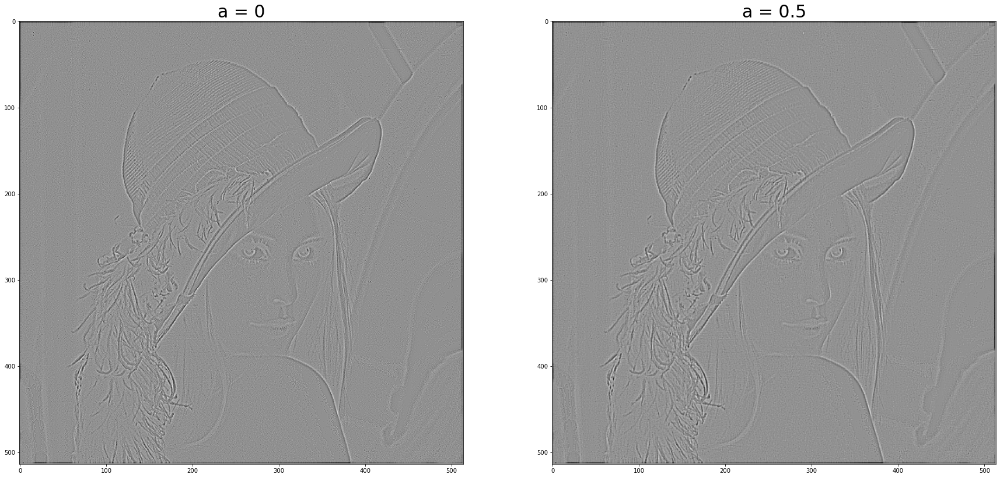

In [38]:
fig = plt.figure(figsize=(30,30))
a=fig.add_subplot(1,2,1)
plt.imshow(lp_op1_img,cmap='gray')
plt.title('a = 0',fontsize=30)

a=fig.add_subplot(1,2,2)
plt.imshow(lp_op2_img,cmap='gray')
plt.title('a = 0.5',fontsize=30)